# Filling Elevation

In [1]:
import route2vel
from route2vel.loading import *
from route2vel.route import *
from route2vel.extract import *
import os, sys
import pandas as pd
import numpy as np
import osmnx
import math
import contextily as cx
from datetime import timedelta
import time
import math

import locale
locale.setlocale(locale.LC_ALL, '')

import matplotlib
from matplotlib import pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.colors as mcolors

from shapely import Point

plt.style.use('dark_background')
route2vel.utils.debug = True
pd.set_option('display.float_format', lambda x: f'{x:.3f}')

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
graph_area = "Città Metropolitana di Bologna"
origin_loc = (44.495556, 11.244184) # Zola predosa, fuori
destination_loc = (44.432490, 11.594510) # Castel san pietro, fuori

In [4]:
route2vel.load_config("../..")

Config file loaded: {'graphs_dir': 'D:/Documenti/Universita/tesim/graph', 'ele_method': 'opentopodata', 'ele_api_key': '', 'routing_method': 'graphhopper', 'routing_api_key': '76855765-50a5-4670-9501-e660e2a1acee'}


In [5]:
graph = load_graph(graph_area)
graph_gdf_nodes, graph_gdf_edges = ox.graph_to_gdfs(graph)

Loading graph from D:\Documenti\Universita\tesim\graph\Città Metropolitana di Bologna.graphml ...
Loaded in 8.41s!


In [6]:
print(f"Available cost functions: {get_route_cost_functions()}")

Available cost functions: ['prefer_main_roads']


In [16]:
base_routes = {
    'simple': find_route(graph, origin_loc, destination_loc, weight='travel_time'),
    'new': find_route(graph, origin_loc, destination_loc, weight=None, cost_function='prefer_main_roads', basic_weight='travel_time'),
    'new_alt': find_route(graph, origin_loc, destination_loc, weight=None, penalty_exp=3, cost_function='prefer_main_roads', basic_weight='travel_time'),
}

routes = {k: route_to_edges(graph, base_routes[k]) for k in base_routes}

print()
print(f"Basic route length: {len(routes['simple']) + 1} nodes, {measure_route(routes['simple'], 'length') / 1000:.2f} km, {timedelta(seconds=measure_route(routes['simple'], 'travel_time'))}")
print(f"Better route length: {len(routes['new']) + 1} nodes, {measure_route(routes['new'], 'length') / 1000:.2f} km, {timedelta(seconds=measure_route(routes['new'], 'travel_time'))}")
print(f"Better route length (alt): {len(routes['new_alt']) + 1} nodes, {measure_route(routes['new_alt'], 'length') / 1000:.2f} km, {timedelta(seconds=measure_route(routes['new_alt'], 'travel_time'))}")

Origin node: 257360446
Destination node: 5459661343
Using weight key: travel_time, cost_function: -
Origin node: 257360446
Destination node: 5459661343
Using weight key: None, cost_function: prefer_main_roads
Origin node: 257360446
Destination node: 5459661343
Using weight key: None, cost_function: prefer_main_roads

Basic route length: 109 nodes, 37.72 km, 0:24:29.700000
Better route length: 45 nodes, 43.09 km, 0:26:39.300000
Better route length (alt): 59 nodes, 44.98 km, 0:27:49.800000


In [18]:
orig_loc_coords = ox.geocode(origin_loc)
dest_loc_coords = ox.geocode(destination_loc)
route2vel.utils.debug = False
print("Basic route performance")
%timeit find_route(graph, orig_loc_coords, dest_loc_coords, weight='travel_time')
print("New route performance")
%timeit find_route(graph, origin_loc, destination_loc, weight=None, cost_function='prefer_main_roads', basic_weight='travel_time')
route2vel.utils.debug = True

Basic route performance
100 ms ± 3.02 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
New route performance
124 ms ± 2.18 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


The performance is bad with bigger graphs, but likely mostly because the routing code is being run on the entire region's graph. Optimization are to be done in that regard.

In [ ]:
route_dfs = {k: pd.DataFrame([v.edge for v in routes[k]]).drop('data', axis=1) for k in routes}
pd.DataFrame({
    f'route_{k}': route_dfs[k]['highway'].explode().value_counts() for k in route_dfs
}).fillna(0).astype('int32')

,route_simple,route_new,route_new_alt
highway,,,
motorway,1,8,8
motorway_link,5,5,5
primary,3,0,0
residential,4,4,0
secondary,7,2,14
secondary_link,1,1,3
tertiary,53,12,12
tertiary_link,1,0,0
trunk,26,5,5


In [ ]:
with pd.option_context("display.float_format", '{:.1f}'.format):
    display(pd.DataFrame({
        f'route_{k}': route_dfs[k].explode('highway').groupby('highway')['length'].sum().apply(lambda x: round(x / 1000, 1)) for k in route_dfs
    }).fillna(0))

,route_simple,route_new,route_new_alt
highway,,,
motorway,15.0,33.6,33.6
motorway_link,1.8,1.5,1.5
primary,0.1,0.0,0.0
residential,1.0,1.0,0.0
secondary,0.8,1.0,2.8
secondary_link,0.3,0.2,0.2
tertiary,5.9,0.7,0.7
tertiary_link,0.0,0.0,0.0
trunk,12.8,3.7,3.7


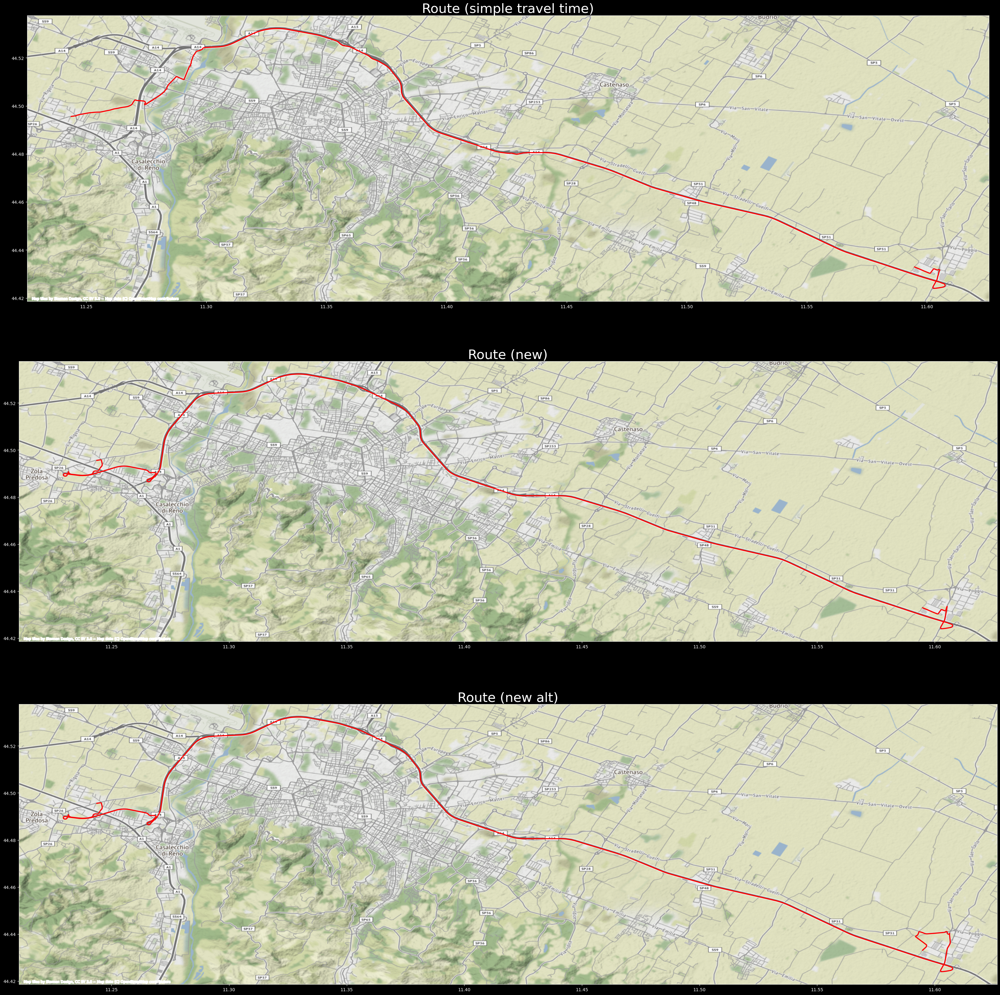

In [ ]:
fig, axes = plt.subplots(nrows=len(routes.keys()), figsize=(40, 40))

route_titles = {
    'simple': "Route (simple travel time)",
    'new': "Route (new)",
    'new_alt': "Route (new alt)",
}

for (ax, k) in zip(axes, routes.keys()):
    route = routes[k]
    title = route_titles[k]
    pos_gdf = gpd.GeoDataFrame({'geometry': [segment.edge.geometry for segment in route]})
    ax = pos_gdf.plot(color='r', edgecolor='k', linewidth=2.5, ax=ax)
    cx.add_basemap(ax, crs=graph_gdf_edges.crs)
    ax.set_title(title, size=30)
    ax.margins(y=15)

In [ ]:
pos_spd = route_to_pos_spd(routes['new'], use_height=True, dist_check=True)

df = pd.DataFrame(pos_spd)
df['dist_to_next'] = df.drop(0).reset_index()['dist'] - df.reset_index()['dist']
display(df)
display(df.describe())

,pos,speed,dist,node_id,dist_to_next
0,"[11.2435779, 44.4955456, 57.0]",50,0.000,257360446.000,10.088
1,"[11.2437015, 44.4955687, 56.76890141665119]",50,10.088,NaN,8.531
2,"[11.243806, 44.4955883, 56.80458969173437]",50,18.619,NaN,23.490
3,"[11.2440956, 44.4956313, 56.4619069208126]",50,42.109,NaN,16.133
4,"[11.2442945, 44.4956608, 56.630441469376066]",50,58.242,NaN,24.324
...,...,...,...,...,...
715,"[11.6011103, 44.4303015, 40.0]",50,42502.650,NaN,17.489
716,"[11.6009145, 44.4303664, 40.0]",50,42520.138,NaN,188.965
717,"[11.5988484, 44.4312024, 40.0]",50,42709.104,NaN,198.776
718,"[11.5967009, 44.4321432, 40.0]",50,42907.879,NaN,185.591


,speed,dist,node_id,dist_to_next
count,720.000,720.000,45.000,719.000
mean,89.581,14713.132,1805699518.333,59.935
std,36.218,12291.677,2449743151.149,104.059
min,40.000,0.000,6714648.000,1.838
25%,50.000,5463.922,256376467.000,14.742
50%,105.000,11808.181,385726595.000,34.151
75%,130.000,21392.865,3980234868.000,61.002
max,130.000,43093.470,8779040911.000,1503.378


In [ ]:
print("Adding pos vel samples...")
t1 = time.time()
pos_spd_filled = add_pos_vel_samples(pos_spd)
t2 = time.time()
print(f"Added {len(pos_spd_filled) - len(pos_spd)} samples (was {len(pos_spd)}) in {timedelta(seconds=t2 - t1)}")

Adding pos vel samples...
Sample dist is 8.00m
Added 5031 samples (was 720) in 0:00:00.029139


In [ ]:
pos_spd_df = pd.DataFrame(pos_spd_filled)
pos_spd_df['dist_to_next'] = pos_spd_df.drop(0).reset_index()['dist'] - pos_spd_df.reset_index()['dist']
display(pos_spd_df)
pos_spd_df.describe()

,dist,speed,pos,node_id,dist_to_next
0,0.000,50,"[11.2435779, 44.4955456, 57.0]",257360446.000,8.000
1,8.000,50,"[11.2436397, 44.495557149999996, 56.8844507083...",NaN,2.088
2,10.088,50,"[11.2437015, 44.4955687, 56.76890141665119]",NaN,8.000
3,18.088,50,"[11.24375375, 44.4955785, 56.78674555419278]",NaN,0.531
4,18.619,50,"[11.243806, 44.4955883, 56.80458969173437]",NaN,8.000
...,...,...,...,...,...
5746,43067.879,50,"[11.5950154, 44.432840866666666, 40.0]",NaN,8.000
5747,43075.879,50,"[11.594931125, 44.432875749999994, 40.0]",NaN,8.000
5748,43083.879,50,"[11.59484685, 44.43291063333333, 40.0]",NaN,8.000
5749,43091.879,50,"[11.594762575, 44.43294551666666, 40.0]",NaN,1.591


,dist,speed,node_id,dist_to_next
count,5751.000,5751.000,45.000,5750.000
mean,21120.537,108.019,1805699518.333,7.495
std,12562.345,29.462,2449743151.149,1.575
min,0.000,40.000,6714648.000,0.024
25%,10132.284,105.000,256376467.000,8.000
50%,20894.696,130.000,385726595.000,8.000
75%,31991.563,130.000,3980234868.000,8.000
max,43093.470,130.000,8779040911.000,8.000


C:\Users\fillo\AppData\Local\Temp\ipykernel_15972\524775060.py:2: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  pos_spd_gdf['geometry'] = pos_spd_gdf['pos'].apply(lambda coords: Point(coords[:2]))


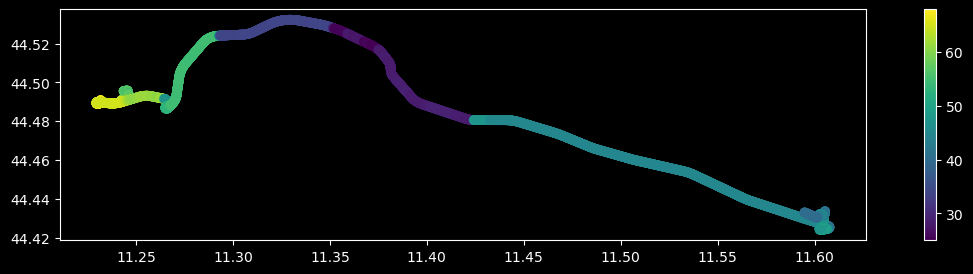

In [ ]:
pos_spd_gdf = gpd.GeoDataFrame(pos_spd_filled)
pos_spd_gdf['geometry'] = pos_spd_gdf['pos'].apply(lambda coords: Point(coords[:2]))
pos_spd_gdf.set_geometry('geometry')
pos_spd_gdf['z'] = pos_spd_gdf['pos'].apply(lambda coords: coords[2])
pos_spd_gdf = pos_spd_gdf.set_geometry('geometry')
pos_spd_gdf.plot('z', figsize=(15,3), legend=True);

## Routing online services

Use routing services through the [*routingpy*](https://routingpy.readthedocs.io) package for better and faster routing. Even before operating, general pros and cons:

Pros:
- Advanced services, that include handling truck restrictions and preferences

Cons:
- Online-only, or external programs
- Rate limiting and/or subscriptions

In [ ]:
import routingpy

In [ ]:
from_coords = ox.geocode(origin_loc) #lat then long
to_coords = ox.geocode(destination_loc)
[from_coords, to_coords]

[(28.7299133, -105.9991912), (28.7299133, -105.9991912)]

Services with truck support are
- Graphhopper
- HereMaps
- Valhalla (can be run locally, truck support not documented in routingpy)

Valhalla directly offering truck support even if not documented by routingpy suggests other services might allow it too.

First we will attempt to use Graphhopper.

In [ ]:
apikey = route2vel.cfg.get('routing_api_key', '')
if apikey == '':
    apikey = input("API Key")

router_gh = routingpy.routers.get_router_by_name("graphhopper")(api_key=apikey)
display(router_gh)

routingpy.routers.options.default_user_agent = 'route2vel'

In [ ]:
# longitude THEN latitude
gh_route = router_gh.directions([from_coords[::-1], to_coords[::-1]], profile='truck')

In [ ]:
display(gh_route.geometry[:5])
print(f"Route has {len(gh_route.geometry)} positions, duration: {timedelta(seconds=gh_route.duration)}, distance: {gh_route.distance / 1000:.2f}km")

[(-105.99879, 28.73056)]

Route has 1 positions, duration: 0:00:00, distance: 0.00km


ValueError: aspect must be finite and positive 

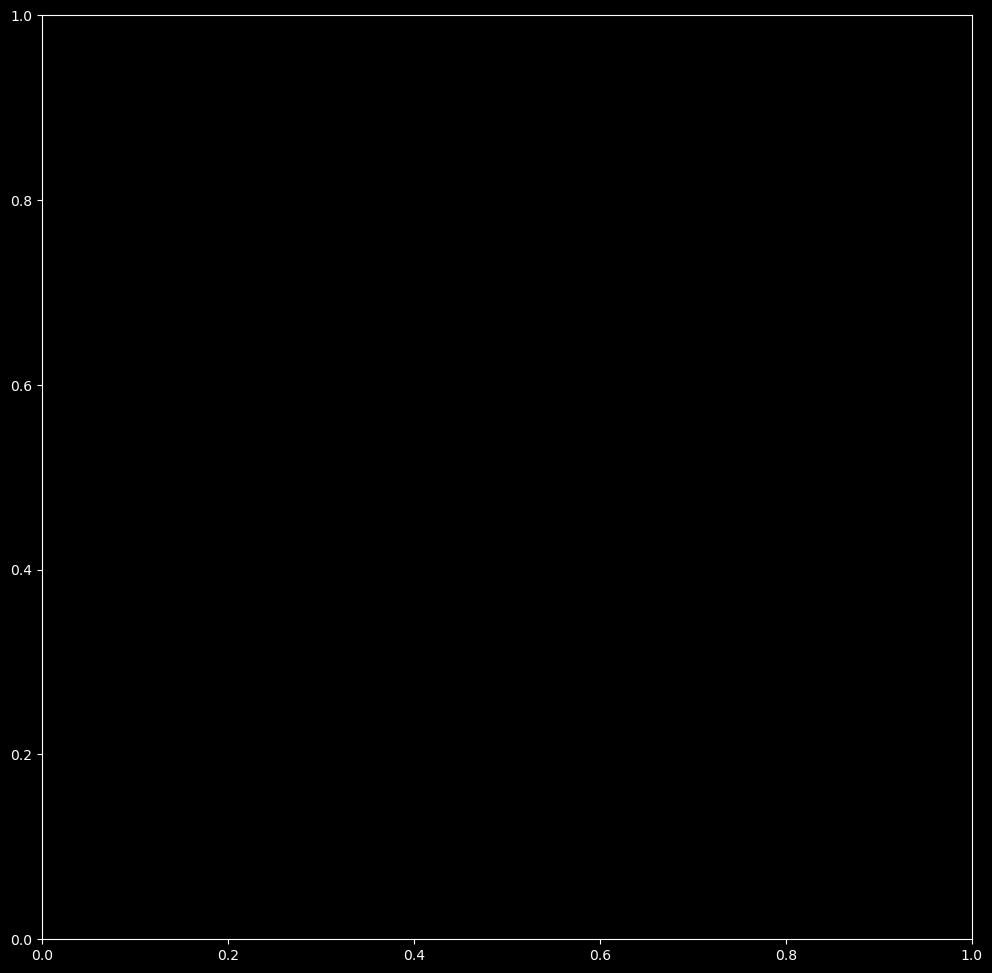

In [ ]:
crs = 'epsg:4326'
gh_route_gdf = gpd.GeoDataFrame({'geometry': [Point(x) for x in gh_route.geometry]}, crs=crs)
xmin = gh_route_gdf['geometry'].apply(lambda p: p.x).min() - 0.05
xmax = gh_route_gdf['geometry'].apply(lambda p: p.x).max() + 0.05
ymin = gh_route_gdf['geometry'].apply(lambda p: p.y).min() - 0.05
ymax = gh_route_gdf['geometry'].apply(lambda p: p.y).max() + 0.05
fig, ax = plt.subplots(figsize=(12, 12))
graph_gdf_edges.cx[xmin:xmax, ymin:ymax].to_crs(crs).plot(ax=ax, alpha=0.35, edgecolor='#111111', zorder=1)
gh_route_gdf.plot(ax = ax, color='r', edgecolor='k')
cx.add_basemap(ax, crs=crs)
plt.title("GraphHopper route");

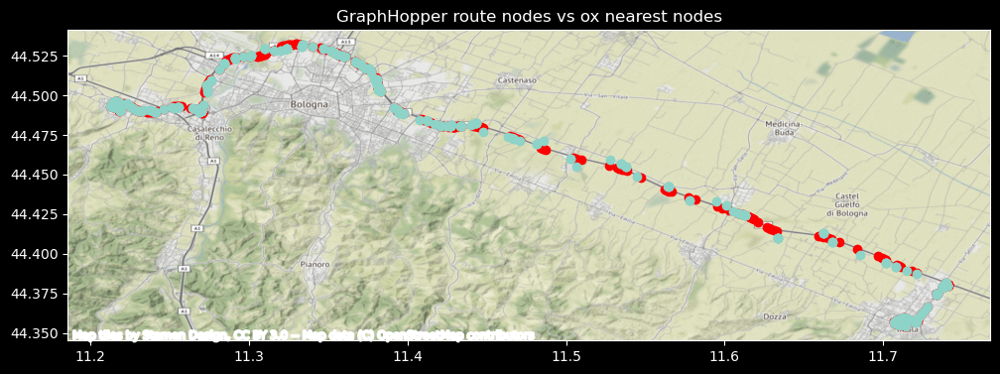

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
gh_route_gdf.plot(ax = ax, color='r')
points = ox.nearest_nodes(graph, [x[0] for x in gh_route.geometry], [x[1] for x in gh_route.geometry])
graph_gdf_nodes.loc[points, 'geometry'].plot(ax=ax);
cx.add_basemap(ax, crs=graph_gdf_nodes.crs)
plt.title("GraphHopper route nodes vs ox nearest nodes");

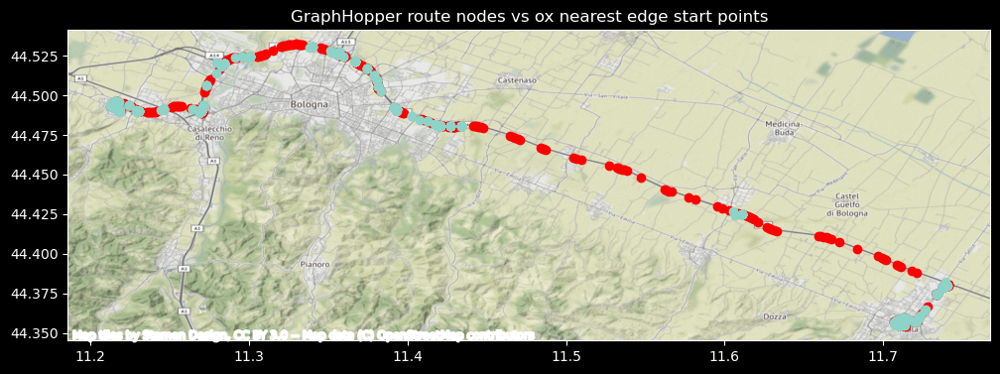

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
gh_route_gdf.plot(ax = ax, color='r')
edges = ox.nearest_edges(graph, [x[0] for x in gh_route.geometry], [x[1] for x in gh_route.geometry])
edge_start_nodes = [e[0] for e in edges]
graph_gdf_nodes.loc[edge_start_nodes, 'geometry'].plot(ax=ax);
cx.add_basemap(ax, crs=graph_gdf_nodes.crs)
plt.title("GraphHopper route nodes vs ox nearest edge start points");

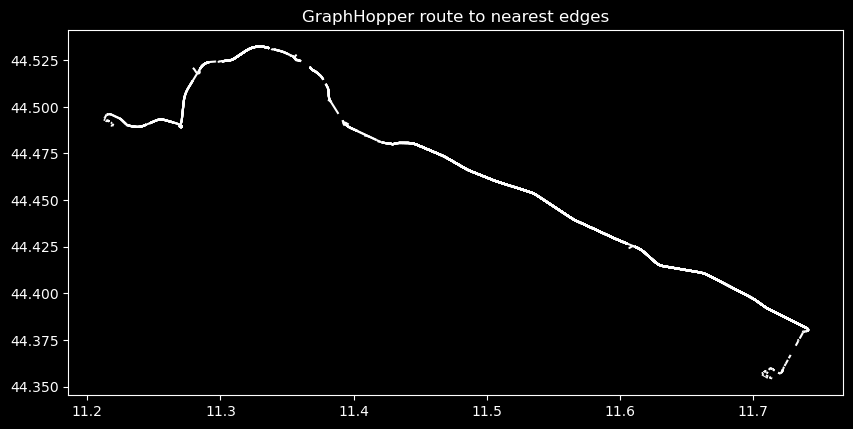

In [ ]:
edges = ox.nearest_edges(graph, [x[0] for x in gh_route.geometry], [x[1] for x in gh_route.geometry])
graph_gdf_edges.loc[edges, 'geometry'].plot(figsize = (10, 6));
plt.title("GraphHopper route to nearest edges");

As seen from the graphs, it's hard to make the coordinates returned by GraphHopper match with OSM nodes, which is required to fill geometry and elevation.

We will try using Valhalla next. This is a locally hosted instance, for more information see https://github.com/gis-ops/docker-valhalla

Run the following in the repository root folder for initial setup of the docker instance:
```
mkdir valhalla_files
wget -O valhalla_files/nord-est-latest.osm.pbf http://download.geofabrik.de/europe/italy/nord-est-latest.osm.pbf
docker run -dt --name valhalla_gis-ops -p 8002:8002 -v $PWD/valhalla_files:/custom_files ghcr.io/gis-ops/docker-valhalla/valhalla:latest
```

In [ ]:
router_vh = routingpy.routers.get_router_by_name("valhalla")('http://localhost:8002')
display(router_vh)

In [ ]:
vh_route = router_vh.directions([from_coords[::-1], to_coords[::-1]], profile='truck')

In [ ]:
display(vh_route.geometry[:5])
print(f"Route has {len(vh_route.geometry)} positions, duration: {timedelta(seconds=vh_route.duration)}, distance: {vh_route.distance / 1000:.2f}km")

[(11.218392, 44.489818),
 (11.218945, 44.489665),
 (11.219204, 44.49013),
 (11.219454, 44.490578),
 (11.219624, 44.490882)]

Route has 874 positions, duration: 0:38:03, distance: 57.62km


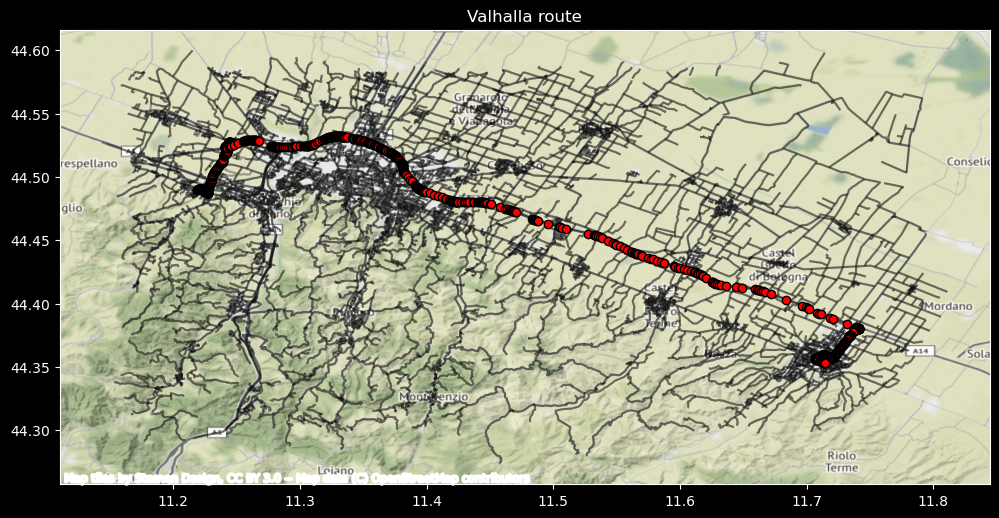

In [ ]:
crs = 'epsg:4326'
vh_route_gdf = gpd.GeoDataFrame({'geometry': [Point(x) for x in vh_route.geometry]}, crs=crs)
xmin = vh_route_gdf['geometry'].apply(lambda p: p.x).min() - 0.05
xmax = vh_route_gdf['geometry'].apply(lambda p: p.x).max() + 0.05
ymin = vh_route_gdf['geometry'].apply(lambda p: p.y).min() - 0.05
ymax = vh_route_gdf['geometry'].apply(lambda p: p.y).max() + 0.05
fig, ax = plt.subplots(figsize=(12, 12))
graph_gdf_edges.cx[xmin:xmax, ymin:ymax].to_crs(crs).plot(ax=ax, alpha=0.35, edgecolor='#111111', zorder=1)
vh_route_gdf.plot(ax = ax, color='r', edgecolor='k')
cx.add_basemap(ax, crs=crs)
plt.title("Valhalla route");

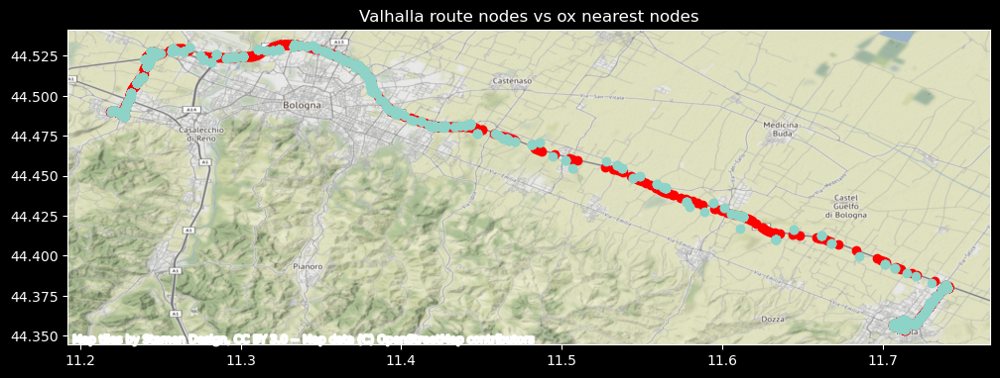

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
vh_route_gdf.plot(ax = ax, color='r')
points = ox.nearest_nodes(graph, [x[0] for x in vh_route.geometry], [x[1] for x in vh_route.geometry])
graph_gdf_nodes.loc[points, 'geometry'].plot(ax=ax);
cx.add_basemap(ax, crs=graph_gdf_nodes.crs)
plt.title("Valhalla route nodes vs ox nearest nodes");

Results aren't particularly different than GraphHopper; this does mean more work in adapting them will be necessary, but also shows in the meantime Valhalla even if locally hosted is a very valid alternative performance-wise.

Now, let's compare route points to the graph points.

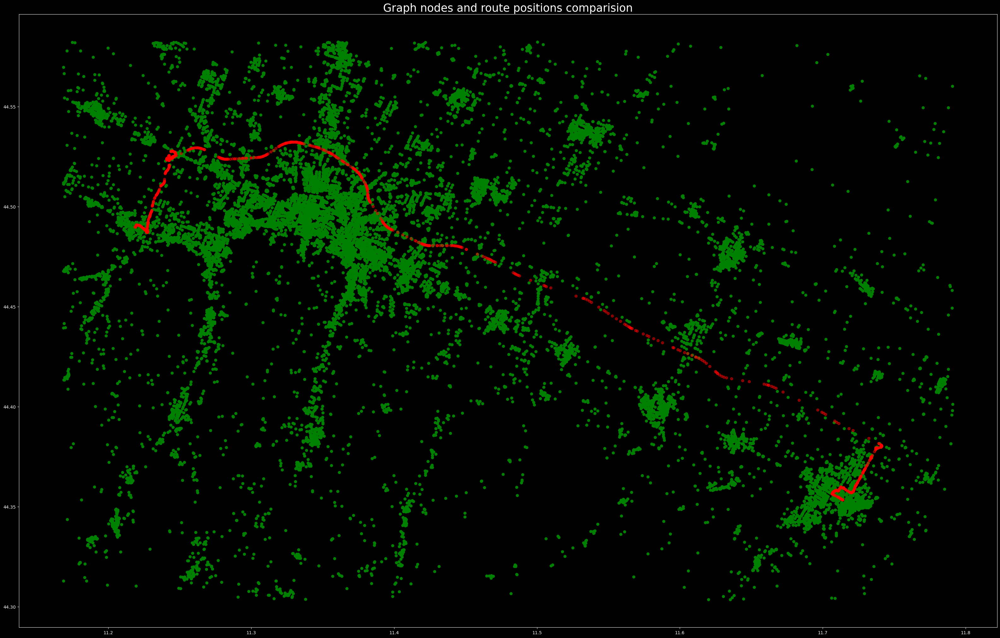

In [ ]:
crs = 'epsg:4326'
fig, ax = plt.subplots(figsize=(40, 40))
xmin = vh_route_gdf['geometry'].apply(lambda p: p.x).min()
xmax = vh_route_gdf['geometry'].apply(lambda p: p.x).max()
ymin = vh_route_gdf['geometry'].apply(lambda p: p.y).min()
ymax = vh_route_gdf['geometry'].apply(lambda p: p.y).max()

graph_gdf_nodes.cx[xmin:xmax, ymin:ymax].to_crs(crs).plot(ax=ax, color='g')
vh_route_gdf.to_crs(crs).plot(ax = ax, color='r', alpha=0.5)
plt.title("Graph nodes and route positions comparision", size=25);
